In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/train.csv
/kaggle/input/sample_submission.csv
/kaggle/input/test.csv
/kaggle/input/data_description.txt


In [2]:
train = pd.read_csv('../input/train.csv')
test = pd.read_csv('../input/test.csv')

In [3]:
train.shape, test.shape

((1460, 81), (1459, 80))

In [4]:
train.info(), test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

(None, None)

In [5]:
import pandas_profiling as pp # help with profiling the dataset

In [6]:
pp.ProfileReport(train)

In [7]:
pp.ProfileReport(test)

In [8]:
import missingno as mno # help analyse missing values

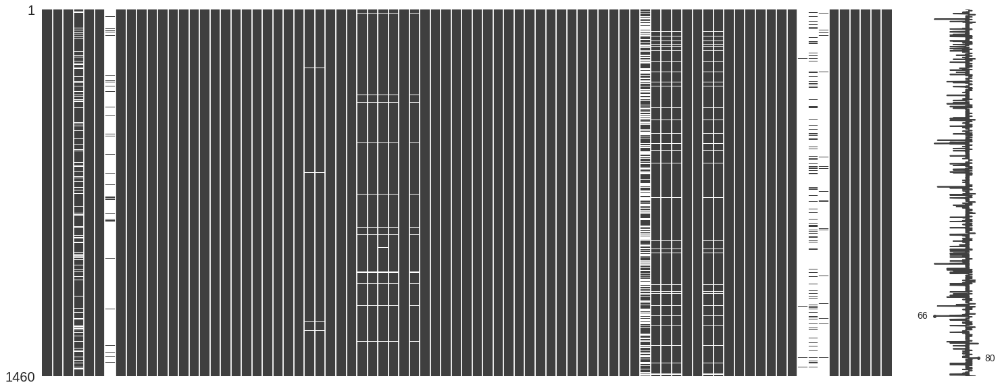

In [9]:
mno.matrix(train)

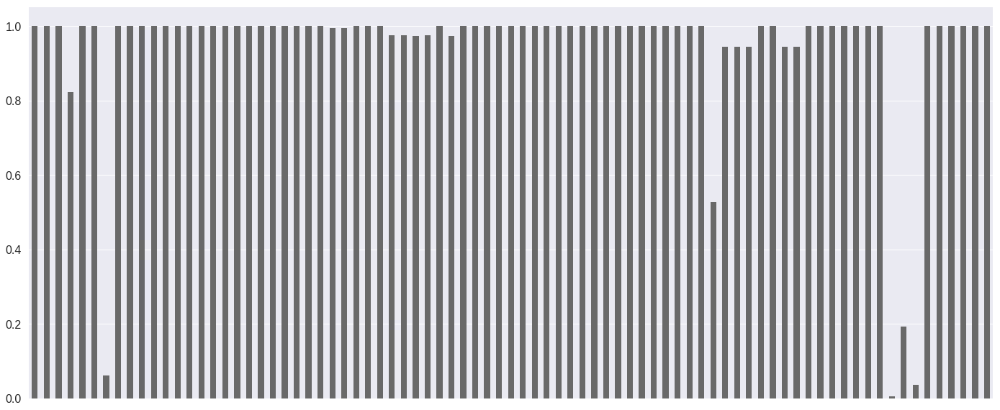

In [10]:
mno.bar(train)

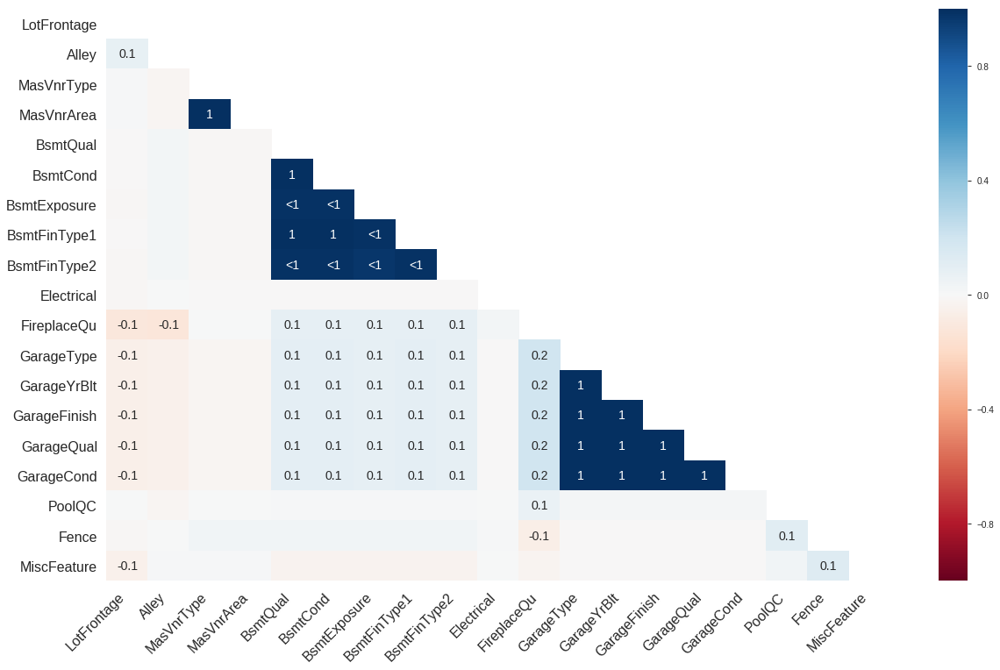

In [11]:
mno.heatmap(train)

combing both train and test, so i anaylse them both once, i will split them later 

In [12]:
combined = [train, test] #a list of both test and train

lets look at the missing values in each column

In [13]:
missing = pd.DataFrame()

for i in combined[0].columns:
    if combined[0][i].isnull().any() == True:
        missing = missing.append({'Column':i, 'Dtype': combined[0][i].dtypes, 'Count': combined[0][i].count().astype(int), 'Missing%':(combined[0][i].isnull().sum()/combined[0].shape[0])
        *100}, ignore_index = True)
        
missing

,Column,Count,Dtype,Missing%
0,LotFrontage,1201.0,float64,17.739726
1,Alley,91.0,object,93.767123
2,MasVnrType,1452.0,object,0.547945
3,MasVnrArea,1452.0,float64,0.547945
4,BsmtQual,1423.0,object,2.534247
5,BsmtCond,1423.0,object,2.534247
6,BsmtExposure,1422.0,object,2.602740
7,BsmtFinType1,1423.0,object,2.534247
8,BsmtFinType2,1422.0,object,2.602740
9,Electrical,1459.0,object,0.068493


splitting data again back to train and test as before

In [14]:
train_df = train
test_df = test

In [15]:
train_df.shape, test_df.shape

((1460, 81), (1459, 80))

In [16]:
# i will need these later 
train_id = train_df['Id']
test_id = test_df['Id']

In [17]:
train_df.shape, test_df.shape

((1460, 81), (1459, 80))

In [18]:
train_df['Identifier'] = 'Train'
test_df['Identifier'] = 'Test'

let me concatnate both dfs so i can deal with missing values in both dfs at once

In [19]:
both = [train_df, test_df]

In [20]:
new_df = pd.concat(both)

In [21]:
new_df.head(3)

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,856,854,0,NaN,3,1Fam,TA,No,706.0,0.0,...,WD,0,Pave,8,856.0,AllPub,0,2003,2003,2008
1,1262,0,0,NaN,3,1Fam,TA,Gd,978.0,0.0,...,WD,0,Pave,6,1262.0,AllPub,298,1976,1976,2007
2,920,866,0,NaN,3,1Fam,TA,Mn,486.0,0.0,...,WD,0,Pave,6,920.0,AllPub,0,2001,2002,2008


In [22]:
#start dealing with missing values
total = new_df.isnull().sum().sort_values(ascending = False)
percent = (new_df.isnull().sum()/new_df.isnull().count()).sort_values(ascending = False)

missing_data = pd.concat([total, percent], axis=1, keys =['Total', 'Percent'])
missing_data
           

,Total,Percent
PoolQC,2909,0.996574
MiscFeature,2814,0.964029
Alley,2721,0.932169
Fence,2348,0.804385
SalePrice,1459,0.499829
FireplaceQu,1420,0.486468
LotFrontage,486,0.166495
GarageCond,159,0.054471
GarageYrBlt,159,0.054471
GarageQual,159,0.054471


dropping data with > .8 missing

In [23]:
dropped = missing_data.loc[missing_data['Percent']>0.8].index
print(dropped)
new_df = new_df.drop(dropped, axis=1)

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence'], dtype='object')


In [24]:
new_df.shape

(2919, 78)

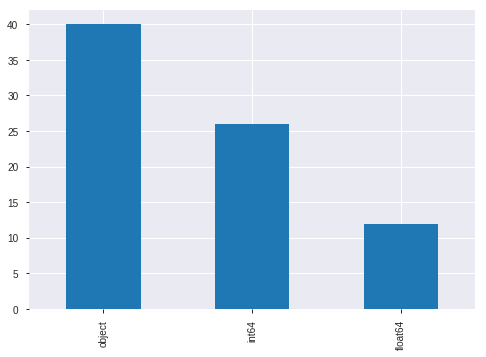

In [25]:
new_df.dtypes.value_counts().plot(kind='bar')
#plt.xticks(rotation =30)
#plt.ylabel('count')
#plt.title('Variable datatypes')


In [26]:
#splitting data back train and test
train_data = new_df[new_df.Identifier == 'Train']
test_data = new_df[new_df.Identifier == 'Test']

In [27]:
train_data.shape, test_data.shape

((1460, 78), (1459, 78))

In [28]:
train_data.drop(columns ='Identifier', inplace = True)
test_data.drop(columns = 'Identifier', inplace = True)

In [29]:
'Identifier' in train_data
'Identifier' in test_data

False

Encoding

In [30]:
object_col1 = train_data.columns[train_data.dtypes == 'object']
len(object_col1)
object_col1


Index(['BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'BsmtQual', 'CentralAir', 'Condition1', 'Condition2', 'Electrical',
       'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'FireplaceQu',
       'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenQual',
       'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 'MSZoning',
       'MasVnrType', 'Neighborhood', 'PavedDrive', 'RoofMatl', 'RoofStyle',
       'SaleCondition', 'SaleType', 'Street', 'Utilities'],
      dtype='object')

In [31]:
for item in object_col1:
    train_data[item] = train[item].astype('category')
    
category_col1 = train_data.select_dtypes(['category']).columns
train_data[category_col1] = train_data[category_col1].apply(lambda x : x.cat.codes)

train_data.head(3)

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,856,854,0,3,0,3,3,706.0,0.0,2,...,8,0,1,8,856.0,0,0,2003,2003,2008
1,1262,0,0,3,0,3,1,978.0,0.0,0,...,8,0,1,6,1262.0,0,298,1976,1976,2007
2,920,866,0,3,0,3,2,486.0,0.0,2,...,8,0,1,6,920.0,0,0,2001,2002,2008


In [32]:
object_col2 = test_data.columns[test_data.dtypes == 'object']
len(object_col2)
object_col2

Index(['BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'BsmtQual', 'CentralAir', 'Condition1', 'Condition2', 'Electrical',
       'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'FireplaceQu',
       'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual',
       'GarageType', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenQual',
       'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 'MSZoning',
       'MasVnrType', 'Neighborhood', 'PavedDrive', 'RoofMatl', 'RoofStyle',
       'SaleCondition', 'SaleType', 'Street', 'Utilities'],
      dtype='object')

In [33]:
for item in object_col2:
    test_data[item] = test_data[item].astype('category')
    
category_col2 = test_data.select_dtypes(['category']).columns
test_data[category_col2] = test_data[category_col2].apply(lambda x : x.cat.codes)

test_data.head(3)
test_data.tail(3)

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1456,1224,0,0,4,0,3,3,1224.0,0.0,0,...,8,0,1,7,1224.0,0,474,1960,1996,2006
1457,970,0,0,3,0,3,0,337.0,0.0,2,...,8,0,1,6,912.0,0,80,1992,1992,2006
1458,996,1004,0,3,0,3,0,758.0,0.0,3,...,8,0,1,9,996.0,0,190,1993,1994,2006


Filling in the NaN with 0

In [34]:
train_data.fillna(0)

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,856,854,0,3,0,3,3,706.0,0.0,2,...,8,0,1,8,856.0,0,0,2003,2003,2008
1,1262,0,0,3,0,3,1,978.0,0.0,0,...,8,0,1,6,1262.0,0,298,1976,1976,2007
2,920,866,0,3,0,3,2,486.0,0.0,2,...,8,0,1,6,920.0,0,0,2001,2002,2008
3,961,756,0,3,0,1,3,216.0,0.0,0,...,8,0,1,7,756.0,0,0,1915,1970,2006
4,1145,1053,0,4,0,3,0,655.0,0.0,2,...,8,0,1,9,1145.0,0,192,2000,2000,2008
5,796,566,320,1,0,3,3,732.0,0.0,2,...,8,0,1,5,796.0,0,40,1993,1995,2009
6,1694,0,0,3,0,3,0,1369.0,0.0,2,...,8,0,1,7,1686.0,0,255,2004,2005,2007
7,1107,983,0,3,0,3,2,859.0,32.0,0,...,8,0,1,7,1107.0,0,235,1973,1973,2009
8,1022,752,0,2,0,3,3,0.0,0.0,5,...,8,0,1,8,952.0,0,90,1931,1950,2008
9,1077,0,0,2,1,3,3,851.0,0.0,2,...,8,0,1,5,991.0,0,0,1939,1950,2008


In [35]:
test_data.fillna(0, inplace = True)

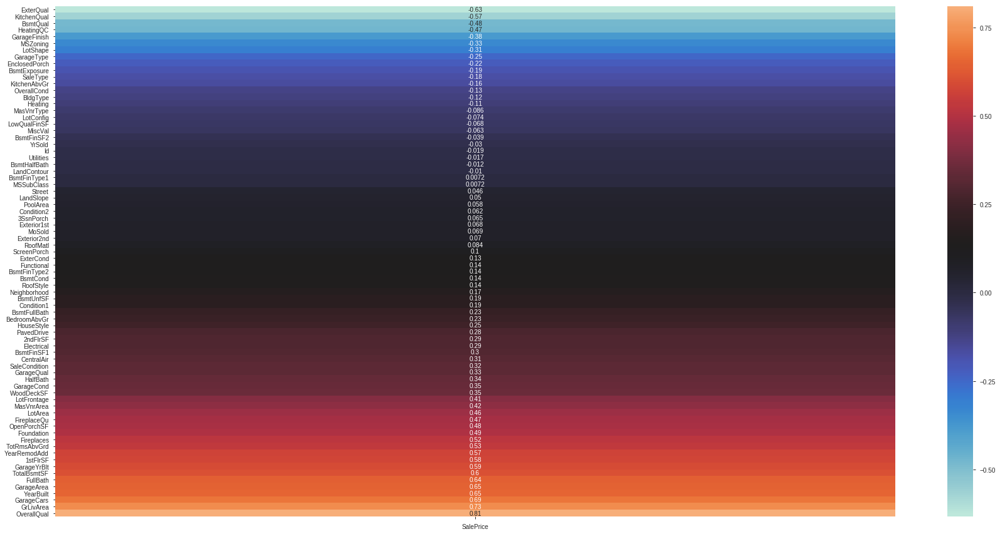

In [36]:
plt.figure(figsize = (30,15))
co = train_data.corr(method ='spearman')[['SalePrice']].sort_values('SalePrice',ascending = True)[:-1]
sns.heatmap(co, annot =True, center = np.median(co))
plt.show()

In [37]:
train_data.shape

(1460, 77)

In [38]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 77 columns):
1stFlrSF         1460 non-null int64
2ndFlrSF         1460 non-null int64
3SsnPorch        1460 non-null int64
BedroomAbvGr     1460 non-null int64
BldgType         1460 non-null int8
BsmtCond         1460 non-null int8
BsmtExposure     1460 non-null int8
BsmtFinSF1       1460 non-null float64
BsmtFinSF2       1460 non-null float64
BsmtFinType1     1460 non-null int8
BsmtFinType2     1460 non-null int8
BsmtFullBath     1460 non-null float64
BsmtHalfBath     1460 non-null float64
BsmtQual         1460 non-null int8
BsmtUnfSF        1460 non-null float64
CentralAir       1460 non-null int8
Condition1       1460 non-null int8
Condition2       1460 non-null int8
Electrical       1460 non-null int8
EnclosedPorch    1460 non-null int64
ExterCond        1460 non-null int8
ExterQual        1460 non-null int8
Exterior1st      1460 non-null int8
Exterior2nd      1460 non-null int8
Fireplace

In [39]:
train_data['GarageYrBlt'].fillna(0, inplace = True)

In [40]:
train_data['LotFrontage'].fillna(0, inplace = True)

In [41]:
train_data['MasVnrArea'].fillna(0, inplace = True)

In [42]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 77 columns):
1stFlrSF         1460 non-null int64
2ndFlrSF         1460 non-null int64
3SsnPorch        1460 non-null int64
BedroomAbvGr     1460 non-null int64
BldgType         1460 non-null int8
BsmtCond         1460 non-null int8
BsmtExposure     1460 non-null int8
BsmtFinSF1       1460 non-null float64
BsmtFinSF2       1460 non-null float64
BsmtFinType1     1460 non-null int8
BsmtFinType2     1460 non-null int8
BsmtFullBath     1460 non-null float64
BsmtHalfBath     1460 non-null float64
BsmtQual         1460 non-null int8
BsmtUnfSF        1460 non-null float64
CentralAir       1460 non-null int8
Condition1       1460 non-null int8
Condition2       1460 non-null int8
Electrical       1460 non-null int8
EnclosedPorch    1460 non-null int64
ExterCond        1460 non-null int8
ExterQual        1460 non-null int8
Exterior1st      1460 non-null int8
Exterior2nd      1460 non-null int8
Fireplace

**Modeling**

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [44]:
from sklearn.model_selection import train_test_split

In [45]:
X = train_data[[col for col in train_data.columns if col != 'SalePrice']]
y = train_data['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3)
#created a dic to make instances of the models,
algo = {'LR' : LogisticRegression(),
        'DT' : DecisionTreeClassifier(),
        'RFC' : RandomForestClassifier(n_estimators=100),
        'SVM' : SVC(gamma = 0.01),
        'KNN' : KNeighborsClassifier(n_neighbors = 10)
}

for i, k in algo.items():
    model = k
    model.fit(X_train, y_train)
    print('The accuracy of ' + i + ' is {0:.2f}'.format(model.score(X_test, y_test)*100))

The accuracy of LR is 0.23
The accuracy of DT is 0.23
The accuracy of RFC is 1.37
The accuracy of SVM is 1.37
The accuracy of KNN is 0.23


In [46]:

clr = LogisticRegression()
clr.get_params

<bound method BaseEstimator.get_params of LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)>

In [47]:
from sklearn.model_selection import GridSearchCV

In [48]:
#creating logistic regression
logistic = LogisticRegression()

In [49]:
'''#creating regularization penalty space
penalty = ['l1', 'l2']

#creating regularization hyperparameter space
C = np.logspace(0, 4, 10)

#creating hyperparameter options
hyperparameters = dict(C=C, penalty = penalty)

#creating gridsearch using 5-folds cross validation
clf = GridSearchCV(logistic, hyperparameters, cv = 5, verbose = 0)

#fit grid search
best_model = clf.fit(X, y)

#view best hyperparameters for the best model 
print('best penalty:', best_model.best_estimator_.get_params()['penalty'])
print('best C:', best_model.best_estimator_.get_params()['C'])
'''


"#creating regularization penalty space\npenalty = ['l1', 'l2']\n\n#creating regularization hyperparameter space\nC = np.logspace(0, 4, 10)\n\n#creating hyperparameter options\nhyperparameters = dict(C=C, penalty = penalty)\n\n#creating gridsearch using 5-folds cross validation\nclf = GridSearchCV(logistic, hyperparameters, cv = 5, verbose = 0)\n\n#fit grid search\nbest_model = clf.fit(X, y)\n\n#view best hyperparameters for the best model \nprint('best penalty:', best_model.best_estimator_.get_params()['penalty'])\nprint('best C:', best_model.best_estimator_.get_params()['C'])\n"

In [50]:
logistic = LogisticRegression().fit(X_train, y_train)
print('training set score: %f' %logistic.score(X_train, y_train))
print('testing set score: %f' %logistic.score(X_test, y_test))

training set score: 0.931507
testing set score: 0.002283


In [51]:
#penalty = l1
logistic = LogisticRegression(C=100, penalty = 'l1').fit(X_train, y_train)
print('training set score: %f' %logistic.score(X_train, y_train))
print('testing set score: %f' %logistic.score(X_test, y_test))

training set score: 1.000000
testing set score: 0.004566


In [52]:
#penalty = l2
logistic = LogisticRegression(C=100, penalty = 'l2').fit(X_train, y_train)
print('training set score: %f' %logistic.score(X_train, y_train))
print('testing set score: %f' %logistic.score(X_test, y_test))

training set score: 0.932485
testing set score: 0.004566


In [53]:
logistic = LogisticRegression(C=0.01).fit(X_train, y_train)
print('training set score: %f' %logistic.score(X_train, y_train))
print('testing set score: %f' %logistic.score(X_test, y_test))

training set score: 0.760274
testing set score: 0.002283


from sklearn.model_selection import RandomizedSearchCV
C = np.linspace(1, 200)
penalty = ['l1', 'l2']
hyperparameters = dict(C=C, penalty=penalty)

search = RandomizedSearchCV(model, hyperparameters, n_iter=100, random_state = 41)
search.fit(X_train,y_train)
print(search.best_params_)

Random Hyperparameter grid

In [54]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 42)
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
print(rf.get_params())

Parameters currently in use:

{'bootstrap': True, 'criterion': 'mse', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 'warn', 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


n_estimators = number of trees in the foreset
max_features = max number of features considered for splitting a node
max_depth = max number of levels in each decision tree
min_samples_split = min number of data points placed in a node before the node is split
min_samples_leaf = min number of data points allowed in a leaf node
bootstrap = method for sampling data points (with or without replacement)

In [55]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


Random search training

In [56]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)'''n_iter is one
of the most important arguments which controls the number different combinations to try'''
# Fit the random search model
rf_random.fit(X_train, y_train)
rf_random.best_params_

SyntaxError: invalid syntax (<ipython-input-56-c681a4e805e8>, line 7)

Evalute random search
To determine the whether random search got a better model, we compare the base mosel with the best random search model 

In [ ]:
def evaluate(model, X_test, y_test):
    predictions = model.predict(X_test)
    errors = abs(predictions - y_test)
    mape = 100 * np.median(errors / y_test)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.2f}'.format(np.median(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

In [57]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_test, y_test)

NameError: name 'rf_random' is not defined

In [58]:
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))

NameError: name 'random_accuracy' is not defined

Grid seacrh with cross validation
so we can narrow the range of parameters

In [59]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)

In [60]:
#Fit the grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   42.7s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed:  3.9min finished


{'bootstrap': True,
 'max_depth': 90,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}

In [61]:
best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, X_test, y_test)

NameError: name 'evaluate' is not defined